<a href="https://colab.research.google.com/github/mawady/colab-recipes-cv/blob/main/ObjectClassificationBinary_Infer_ResNet_CatsVsDogs_Pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Info
Developed by Dr. Mohamed Elawady - [[Website](https://mawady.github.io)] - [[Linkedin](https://www.linkedin.com/in/mawady/)]

---

In [ ]:
#https://learnopencv.com/pytorch-for-beginners-image-classification-using-pre-trained-models/

from __future__ import print_function, division

import torch
import torch.nn as nn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import pickle
from PIL import Image
import datetime

plt.ion()   # interactive mode

In [ ]:
from google.colab import files


# https://drive.google.com/file/d/1VMLpE5ojF9fq0GtBKaqcMVWUIfJUfKbc/view?usp=sharing
!gdown --id 1VMLpE5ojF9fq0GtBKaqcMVWUIfJUfKbc
path_class_names = "/content/class_names_restnet_catsVSdogs.pkl"


# https://drive.google.com/file/d/1jorQB1mpPCLH097M8paxut3v5XwVlKqp/view?usp=sharing
!gdown --id 1jorQB1mpPCLH097M8paxut3v5XwVlKqp
path_model = "/content/model_state_restnet_catsVSdogs.pth"



# print("Please upload input image to predict:")
# upload_input = files.upload()
# path_input = "/content/{}".format(list(upload_input.keys())[0])

# https://cdn.pixabay.com/photo/2015/11/16/22/14/cat-1046544_960_720.jpg
# https://upload.wikimedia.org/wikipedia/commons/3/38/Adorable-animal-cat-20787.jpg
!wget https://upload.wikimedia.org/wikipedia/commons/3/38/Adorable-animal-cat-20787.jpg -O cat.jpg
path_input = "/content/cat.jpg"


Downloading...
From: https://drive.google.com/uc?id=1VMLpE5ojF9fq0GtBKaqcMVWUIfJUfKbc
To: /content/class_names_restnet_catsVSdogs.pkl
100% 30.0/30.0 [00:00<00:00, 46.4kB/s]
Downloading...
From: https://drive.google.com/uc?id=1jorQB1mpPCLH097M8paxut3v5XwVlKqp
To: /content/model_state_restnet_catsVSdogs.pth
100% 44.8M/44.8M [00:00<00:00, 169MB/s]
--2021-12-03 14:42:43--  https://upload.wikimedia.org/wikipedia/commons/3/38/Adorable-animal-cat-20787.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.153.240, 2620:0:860:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.153.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1155778 (1.1M) [image/jpeg]
Saving to: ‘cat.jpg’

cat.jpg             100%[===================>]   1.10M  --.-KB/s    in 0.1s    

2021-12-03 14:42:44 (7.36 MB/s) - ‘cat.jpg’ saved [1155778/1155778]



In [ ]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms_val = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

In [ ]:
class_names = pickle.load(open(path_class_names, "rb"))
print(class_names)

['cats', 'dogs']


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft.fc = nn.Linear(num_ftrs, len(class_names))

model_ft = model_ft.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

In [ ]:
model_ft.load_state_dict(copy.deepcopy(torch.load(path_model,device)))

<All keys matched successfully>

In [ ]:
img = Image.open(path_input)
img_t = data_transforms_val(img)
batch_t = torch.unsqueeze(img_t, 0)
model_ft.eval()
# We don't need gradients for test, so wrap in 
# no_grad to save memory
with torch.no_grad():
    batch_t = batch_t.to(device)
    # forward propagation
    output = model_ft( batch_t)
    # get prediction
    probs = torch.nn.functional.softmax(output, dim=1)
    conf, output = torch.max(probs, 1)
    # output = torch.argmax(output, 1)

2021-12-03 14:42:56.118040
Class: cats, confidence socre: 1.00


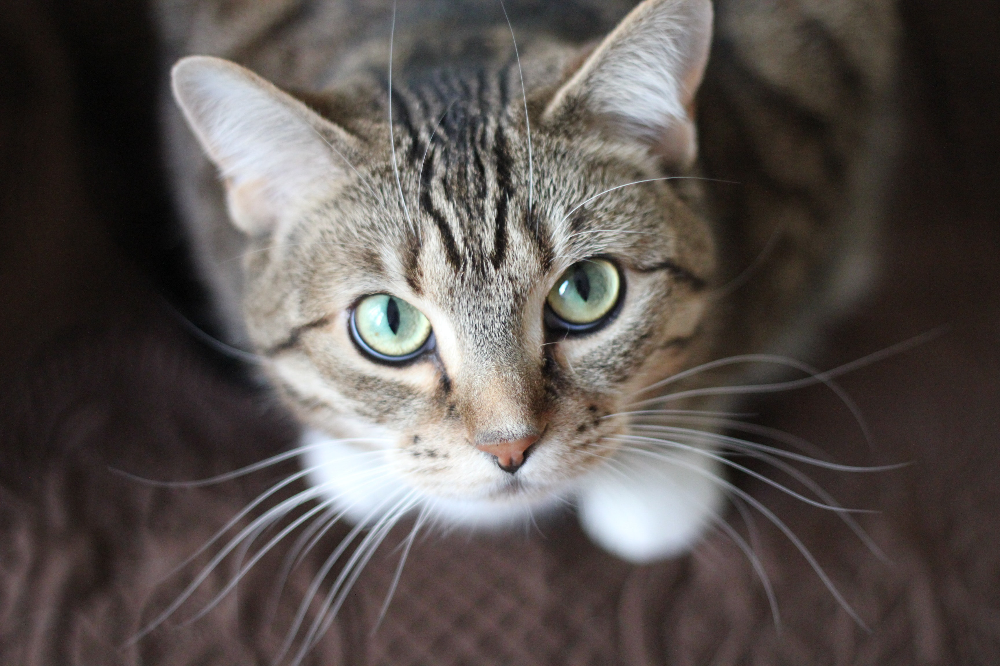

In [ ]:
print(datetime.datetime.now())
print("Class: {}, confidence socre: {:.2f}".format(class_names[output.cpu()], conf[0]))
img